<table style="border: none; text-align: center" width="100%">
  <tr style="border: none">
    <td style="min-width:250px; border:none; text-align:left" bgcolor="white">
      <a href="https://www.audiolabs-erlangen.de/" target="_blank">
        <img src="./files/logo_alabs.svg" style="height:30px; display:inline-block" />
      </a>
    </td>
    <td style="min-width:250px; border:none; text-align:center" bgcolor="white">
      <a href="https://www.fau.de/" target="_blank">
        <img src="./files/logo_fau.svg" style="height:50px; display:inline-block" />
      </a>
    </td>
    <td style="min-width:250px; border:none; text-align:right" bgcolor="white">
      <a href="https://www.iis.fraunhofer.de/" target="_blank">
        <img src="./files/logo_iis.svg" style="height:30px; display:inline-block" />
      </a>
    </td>
</tr>
</table>

<div style="text-align: center">
<h1>Fast Convolution and Cross-Correlation</h1>
<b>Lab Course</b><br/>
<b>International Audio Laboratories Erlangen</b><br/>
<b>Prof. Dr. Frank Wefers, Prof. Dr. Nils Peters</b><br/>
<b>Winter Term 2020</b>
</div>

<br/>

<div class="list-group">
  <a style="padding: 7px" class="list-group-item disabled"><b>Authors</b></a>
  <a style="padding: 7px" href="https://www.audiolabs-erlangen.de/fau/professor/wefers" class="list-group-item">Frank Wefers</a>
  <a style="padding: 7px" href="https://www.audiolabs-erlangen.de/fau/professor/peters" class="list-group-item">Nils Peters</a>
</div>

<div>
<em>Fast convolution and cross-correlation</em>, &copy; September 2018 - October 2020
</div>

## <a name="abstract"></a> Abstract

This experiment gives an overview on finite impulse response (FIR) filters and
their efficient realization with fast convolution techniques.
You will examine, program and test implementations of such filters, in the time and frequency domain.
You will learn about the relationship between convolution and correlation and estimate the time delays between two signals.

## <a name="Introduction">1. Introduction</a>

Digital filters are used to modify, enhance, alter audio signals in countless applications.
Filters can be categorized into different classes based on their properties and structure.
A filter maps an input signal $x(n)$ to an output signal $y(n)$.
Those filters with a linear input-to-output relationship between $a\cdot x(n) \rightarrow a\cdot  y(n)$ are called <i>linear filters</i>.
Adding the constraint of time-invariance $x(n-k) \rightarrow y(n-k)$ leads to <i>linear time-invariant filters</i>.
This particular class suits a wide range of applications, including equalization (EQ), 3D audio rendering, spatial sound playback and reverberation effects.

A linear time-invariant filter consists of three building blocks only: additions, multiplications and delays.
Depending on the arrangement of these units, the filter has either feed-forward structure or it contains feedback loops.
Feedback loops usually result in an infinitely long decaying impulse response, that never reaches exactly zero.
Hence this sub class is called <i>infinite impulse response filters</i> (<i>IIR filters</i>).
When the filter is free of feedback-loops and feed-forward only, the finite number of internal building blocks will result in a finite-length impulse response.
Such a filter is called <i>finite impulse response filter</i> (<i>FIR filter</i>).
In this exercise we consider FIR filters only.
FIR filters can have different internal structures (block diagrams).
However, as their impulse response is finite, one can always arrange them in a unique way, called the <i>direct form</i>. It is shown below.
This block diagram marks the starting point of our considerations.

<br/>
<img src="./files/Direct_form_FIR_filter.png" width="70%" height="70%">
<br/>

## <a name="FIR filters">2. FIR filters and discrete convolution</a>

A direct form FIR filter works as follows:
The input signal $x(n)$ is delayed sample by sample.
All intermediate signals $x(n), x(n\!-\!1), x(n\!-\!2), \dotsc$ are weighted by corresponding filter coefficients $h_0, h_1, h_2, \dotsc$,
and summed up to form the output, given by

\begin{equation}
   y(n) = \sum\limits_{k=0}^{N-1} x(n-k)\cdot h(k) = x(n) \ast h(n)
\end{equation}

This sum formula above is known as <i>discrete convolution</i>.
It can be regarded as a mathematical operator $\ast$, that takes two input sequences and produces one output sequence.
Looking at the block diagram it becomes clear, that the filter coefficients fully determines the FIR filter ("fingerprint").
The impulse response $h(n)$ is its "fingerprint".
Convolution allows us to compute the output $y(n)$ for any input $x(n)$, when $h(n)$ is known.
<br/>
<img src="./files/FIR_relations.png" width="35%" height="35%">
<br/>
The block diagram and formula describe essentially the same thing.
FIR filtering means computing discrete convolutions and vice versa.
Hence, a fast convolution allows us to realize an FIR filter efficiently.
What this exactly means, you will find out in the next minutes.

<div class="alert alert-block alert-info">
  <b>Homework Exercise 1</b><br>
  Two sequences of length $M$ and $N$ are convolved.<br/>
  What is the length of the result?<br/>
</div>

<div class="alert alert-block alert-info">
  <b>Homework Exercise 2</b><br>
  Convolve the sequences $x(n)=[1, 1, 1, 1, 1]$ and $h(n)=[1, 1, 1]$.<br/>
  What is result $y(n)=x(n)\ast h(n)$?<br/>
</div>

#### 2.1 Implementation and testing

Let us start programming.
First, install some Python packages needed for this exercise.

In [6]:
!pip install soundfile librosa==0.6

  Using cached SoundFile-0.10.3.post1-py2.py3-none-any.whl (21 kB)
Processing /home/aplab13/.cache/pip/wheels/d3/e7/ad/add2601223ec9c317a08955ba6131bc5aac3931061d4740c6b/librosa-0.6.0-py3-none-any.whl
Processing /home/aplab13/.cache/pip/wheels/6f/d1/5d/f13da53b1dcbc2624ff548456c9ffb526c914f53c12c318bb4/resampy-0.2.2-py3-none-any.whl
Processing /home/aplab13/.cache/pip/wheels/49/5a/e4/df590783499a992a88de6c0898991d1167453a3196d0d1eeb7/audioread-2.1.9-py3-none-any.whl


Then, import them using the following cell.

In [7]:
import matplotlib.pyplot as plt
import numpy as np
import soundfile as sf

from IPython.display import Audio
from glob import glob
from time import process_time

Later in this exercise, the following helper functions will make life easier for you.
Take a look at the functions and execute the cell to define them.

In [8]:
def zeropad(x, N):
    """Pads a signal with zeros on the right to reach the given length"""
    M = len(x)
    assert M<=N, "Signal is longer than destination length"
    xp = np.zeros((N,))
    xp[0:M] = x
    return xp

def nextPowerOf2(n):
    """Returns the next larger power of two greater or equal n"""
    return 1 if n == 0 else 2**(n - 1).bit_length()

Now let us implement an FIR filter and verify that it works correctly.
Afterwards we test it with different input signals and impulse responses
and measure its computation times.

<div class="alert alert-block alert-warning">
<b>Lab Experiment 1</b><br>
  Implement the FIR filter in the block diagram shown above in the predefined function below.<br/>
  Debug and test it with the two sequences you convolved by hand, until you verified that it produces correct results<br/>
  <br/>
  <u>Hints</u>: <br/>
* Helful NumPy functions: <a href="https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.roll.html" target="blank">roll</a>
  and <a href="https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.dot.html" target="blank">dot</a> <br/>
* Avoid dynamic memory allocation e.g., by using <em>append</em> within a loop function
</div>

In [4]:
def convolution(x, h):
    """Compute the discrete convolution of two sequences"""
    M = len(x)
    N = len(h)

    # Your turn ...
    
    #Basically implementation of "grapical convolution":
    #Time Invert Signal and compute it's inner product to filter sequence for every time shift
    # (just like correlation!!) but without expecation operator/averaging....
    
    x = zeropad(x, N+M)
    h = zeropad(h, N+M)
    
    x = np.flip(x)
    
    y = np.zeros((N+M-1))
    
    
    for i in range(N+M-1):
        
        x = np.roll(x,1)
        y[i] = np.dot(x,h)
        
        
    
    #y = 1

    return y



x = np.array([1,1,1,1])
h = np.array([1,1,1])
print(convolution(x,h))
print(np.convolve(x,h))


[1. 2. 3. 3. 2. 1.]
[1 2 3 3 2 1]


For testing purposes you find audio files in the <i>files</i> directory.
Let see what we have there...

In [5]:
display(glob("files/*.wav"))

['files/speech.wav', 'files/room.wav', 'files/lowpass.wav', 'files/music.wav']

<div class="alert alert-block alert-warning">
<b>Lab Experiment 2</b><br>
  Test your filter with some of the provided audio files.<br/>

  1. Listen to the input signal (<em>speech.wav</em> or <em>music.wav</em>), filter impulse response (<em>lowpass.wav</em> or <em>room.wav</em>) and resulting output signal.<br/>
  2. Print the length of the signals.<br/>
  3. Which relationship between the lengths and runtimes do you observe?<br/>

  <u>Note</u>: convolving the input signal with the <em>room.wav</em> filter response may take some time.
</div>

Dry Audio Singals: Speech and Music


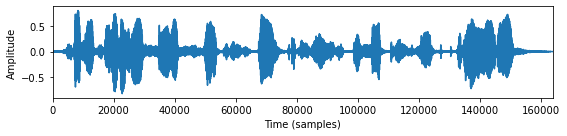

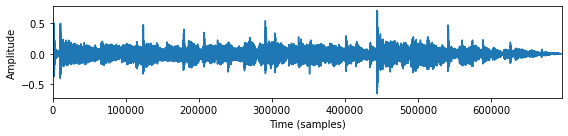

Impulse Responses: Room and Lowpass


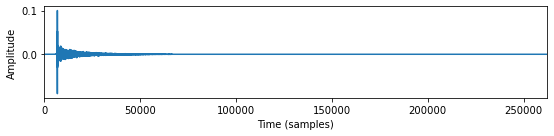

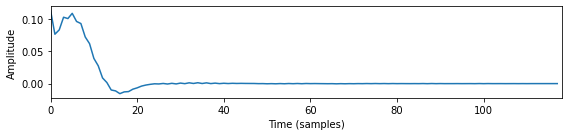

Speech Lowpass:


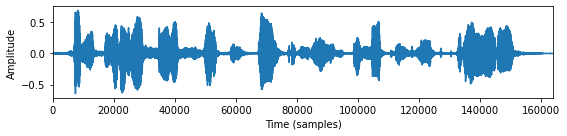

Speech Room:


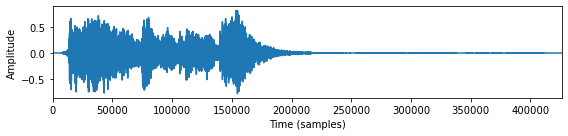

Music Lowpass:


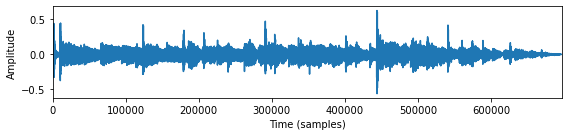

Music Room:


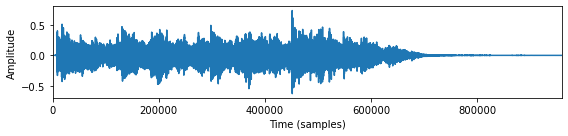

In [6]:
import IPython.display as ipd



print('Dry Audio Singals: Speech and Music')

speech_dry, Fs_speech = sf.read('files/speech.wav')
display( Audio(speech_dry, rate=Fs_speech) )

plt.figure(figsize=(8, 2))
plt.plot(speech_dry)
plt.xlim([0, speech_dry.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()



music_dry, Fs_music = sf.read('files/music.wav')
display( Audio(music_dry, rate=Fs_music) )

plt.figure(figsize=(8, 2))
plt.plot(music_dry)
plt.xlim([0, music_dry.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()



print('Impulse Responses: Room and Lowpass')

room, Fs_room = sf.read('files/room.wav')
display( Audio(room, rate=Fs_room) )

plt.figure(figsize=(8, 2))
plt.plot(room)
plt.xlim([0, room.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()

lowpass, Fs_lowpass = sf.read('files/lowpass.wav')
display( Audio(lowpass, rate=Fs_lowpass) )

plt.figure(figsize=(8, 2))
plt.plot(lowpass)
plt.xlim([0, lowpass.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()




# Filtered Signals:

print('Speech Lowpass:')

speech_lowpass = np.convolve(speech_dry,lowpass)

display( Audio(speech_lowpass, rate=Fs_speech) )

plt.figure(figsize=(8, 2))
plt.plot(speech_lowpass)
plt.xlim([0, speech_lowpass.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()





print('Speech Room:')


speech_room = np.convolve(speech_dry,room)

display( Audio(speech_room, rate=Fs_speech) )

plt.figure(figsize=(8, 2))
plt.plot(speech_room)
plt.xlim([0, speech_room.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()







print('Music Lowpass:')

music_lowpass = np.convolve(music_dry,lowpass)

display( Audio(music_lowpass, rate=Fs_music) )

plt.figure(figsize=(8, 2))
plt.plot(music_lowpass)
plt.xlim([0, music_lowpass.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()





print('Music Room:')


music_room = np.convolve(music_dry,room)

display( Audio(music_room, rate=Fs_music) )

plt.figure(figsize=(8, 2))
plt.plot(music_room)
plt.xlim([0, music_room.shape[0]])
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.tight_layout()
plt.show()





# Observation: Long filter impulse response leads to huge runtimes (not realtime able!)




#### 2.2 Computational performance

How <i>efficient</i> can we filter the input signal $x(n)$ and compute its output $y(n)$?
In other words, how many operations, processor instructions or clock cycles does the filtering consume?
For an application that is important to know.
The computational effort of an algorithm can be assessed in two different ways:
1. We can analyze the algorithm (block diagram) and count the number of relevant operations.
   This usually includes arithmetic operations (i.e. additions and multiplications) only.
   The result is expressed as a function of the input lengths.
   This <i>theoretic complexity</i> allows us to compare different algorithms on paper ("is algorithm A superior to algorithm B?").

2. We can measure execution times of an implementation of the algorithm on an actual machine.
   This captures all practical effects, such as the memory access, cache utilization, etc.
   The result are runtimes or equivalent clock cycles for <i>specific</i> input lengths.

<div class="alert alert-block alert-info">
  <b>Homework Exercise 3</b><br>
  Examine the block diagram above.<br/><br/>
  1. How many operations does it take to filter an input signal $x(n)$ of length $M$ with the impulse response $h(n)$ of length $N$?<br/>
  2. Consider the case that both operands are of length $N$: Come up with a simple upper bound on the number of operations ($\mathcal{O}$-notation).<br/>
</div>

<div class="alert alert-block alert-warning">
<b>Lab Experiment 3</b><br>
  1. Measure the actual runtime of $N\!\times\! N$ discrete convolutions for different length $N$.<br/>
  2. Plot the result in a 2D diagram (runtime $T$ [ms] over length $N$)<br/>
  <br/>
  <u>Hint</u>: Measure times using the function
  <a href="https://docs.python.org/3/library/time.html#time.process_time" target="blank">process_time</a>, which is already included.<br/>
  <u>Note</u>: For more comparable values, you can also measure the NumPy function
  <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.convolve.html" target="blank">convolve</a><br/>
</div>

N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 0 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 1 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 2 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 3 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 4 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 5 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 6 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 7 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done

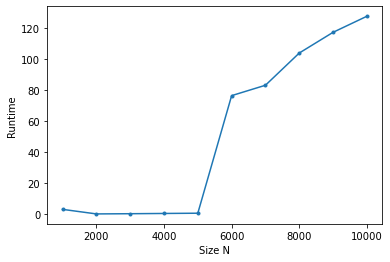

In [7]:
sizes = range(1000, 11000, 1000)
num = len(sizes)
runtimes_convolution = np.zeros((num))
cycles = 20

for c in range(cycles):


    for N in range(num):
        # Your turn ...

        x=np.ones(sizes[N])
        h=np.ones(sizes[N])

        start = process_time()

        convolution(x,h)

        end = process_time()

        runtimes_convolution[N] += ( end-start )
        
        print("N Done: " + str(N),  end= " ")

    print("cycle " + str(c) + " completed")

runtimes_convolution = runtimes_convolution/cycles
        
        
#comparison


plt.plot(sizes, runtimes_convolution, '.-')
plt.xlabel('Size N')
plt.ylabel('Runtime')
plt.show()




cycle 0 completed
cycle 1 completed
cycle 2 completed
cycle 3 completed
cycle 4 completed
cycle 5 completed
cycle 6 completed
cycle 7 completed
cycle 8 completed
cycle 9 completed
cycle 10 completed
cycle 11 completed
cycle 12 completed
cycle 13 completed
cycle 14 completed
cycle 15 completed
cycle 16 completed
cycle 17 completed
cycle 18 completed
cycle 19 completed


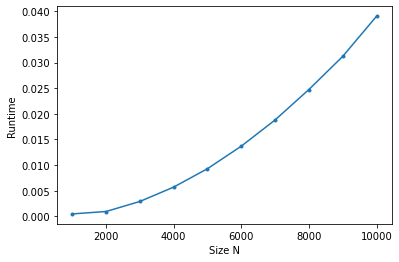

In [8]:
sizes = range(1000, 11000, 1000)
num = len(sizes)
runtimes_convolution_fft = np.zeros((num))
cycles = 20

for c in range(cycles):


    for N in range(num):
        # Your turn ...

        x=np.ones(sizes[N])
        h=np.ones(sizes[N])

        start = process_time()

        np.convolve(x,h)

        end = process_time()

        runtimes_convolution_fft[N] += ( end-start )

    print("cycle " + str(c) + " completed")

runtimes_convolution_fft = runtimes_convolution_fft/cycles
        
        
#comparison


plt.plot(sizes, runtimes_convolution_fft, '.-')
plt.xlabel('Size N')
plt.ylabel('Runtime')
plt.show()




## <a name="Fast convolution">3. Fast convolution</a>

FIR filtering in the time domain becomes computationally complex when operands get longer.
Implementing an FIR filter as shown in block diagram, results at a number of operations that is quadratic over the operand lengths.
For real-time applications this vast amount of operations might be even too many to be handled.
This computational burden is overcome by <i>fast convolution</i> techniques.

A fast convolution is considered an algorithm that computes an $N\!\times\!N$ discrete convolution in asymptotically less than $\mathcal{O}(N^2)$ steps.
Several different techniques are known to achieve this computational efficiency.
The by far most widely used method is fast convolution with the Fast Fourier Transform (FFT), which we will regard here.
This technique is known since the 1960s and became popular as FFT algorithms became available.
Still, more than half a decade later, it remains the most often used building block for all kinds of signal processing and filtering techniques.
Let us examine how it works.

#### 3.1 Discrete Fourier Transform and Circular Convolution Property

The Discrete Fourier Transform (DFT) is a well-known transform, used in many fields of science and technology.
It is defined as follows:

\begin{equation}
x(n) \overset{\mathcal{DFT}}{\rightarrow} X(k) = \sum\limits_{n=0}^{N-1} x(n)e^{-2\pi i\frac{n k}{N}}
\hspace{2em}\text{and}\hspace{2em}
X(k) \overset{\mathcal{IDFT}}{\rightarrow} x(n) = \frac{1}{N} \sum\limits_{k=0}^{N-1} X(k) e^{2\pi i\frac{n k}{N}}
\end{equation}

A length-$K$ DFT maps $K$ time domain samples $x(n)$ to $K$ spectral coefficients $X(k)$ in the frequency domain.

A inherent concept of the DFT is its <i>periodicity</i>, that occurs in time and frequency domain.
A length-$K$ DFT always assumes that input and output are periodic every $K$ elements.
Discrete convolution, needed for implementing FIR filters, is <i>aperiodic</i> and
somewhat incompatible with the DFT. This is overcome by introducing a periodic convolution operator. The concept is illustrated below

<br/>
<img src="./files/time_aliasing.png" width="50%" height="50%">
<br/>

Simply assume, that the input sequence $x(n)$ infinitely repeats to both sides (positive and negative $n$)
every $K$ samples.
This sequence is denoted by $\tilde{x}(n)$.
Then,  <i>circular convolution</i> is defined the same way as discrete convolution

\begin{equation}
   y(n) = \sum\limits_{k=0}^{N-1} \tilde{x}(n-k)\cdot h(k) = x(n) \circledast h(n)
\end{equation}

The <i>Circular Convolution Property</i> (CCP) states, that circular convolution $\circledast$ in the time domain equals the pairwise product $\times$ of spectral coefficients in the frequency domain
\begin{equation}
x(n) \circledast h(n) = \mathcal{IDFT}\{ \mathcal{DFT} \{ x(n)\} \times \mathcal{DFT}\{ h(n)\} \}
\end{equation}

This marks a huge computational improvement, as a $K\!\times\!K$ circular convolution in the time domain requires $\mathcal{O}(K^2)$ steps to compute.
In the frequency domain it becomes just $K$ complex-valued multiplications, which can be computed in $\mathcal{O}(K)$ steps.
Digging deeper in the mathematical background one will find, that this reduction results from a matrix diagonalization.
When circular convolution is written as a matrix-vector product, the DFT marks an eigenvector base that diagonalizes this convolution matrix.
What remains is a simple product of a diagonal matrix with a vector. This is where the impressive reduction originates from.

#### 3.2 Fast Fourier Transforms

Computing a length-$K$ DFT/IDFT by the formulae above also requires $\mathcal{O}(K^2)$.
Consequently, there would be no benefit from computing convolutions in the frequency domain.
This changes, when we use Fast Fourier Transforms (FFT), that compute a length-$K$ DFT/IDFT by just $\mathcal{O}(K\log K)$ operations.

How is this possible? Details on FFT algorithms are way beyond the scope of this experiment. Therefore only a few important remarks are given here.
More information can be found in referenced literature.
In essence, an FFT algorithm hierarchically decomposes long DFTs into shorter DFTs (divide-and-conquer strategy).
This tree-like decomposition removes redundant computations, that occur when using the definition formulae.
Short DFTs of lengths 8, 16, 32, etc. are realized with highly-optimized machine code (assembly language) called codelets.
As many different decompositions as well as codelets exist, a planner determines the best (most efficient) computation strategy.
This strategy and the resulting execution time highly depends on the length $K$ of the transform.

Fast Fourier Transforms can be computed of arbitrary lengths $K$, including prime numbers $K$.
However, they execute most efficiently for lengths $K$, where the number $K$ is composite.
This means, that the prime factorization of $K$ contains few prime factors with comparably large exponents (ideally pure powers-of-two or small integer multiples of these).
Prime-length DFTs require computationally complex reformulations into non-prime-length transforms, making them comparably inefficient.
For this reason, the right choice of transform size determines the performance of the algorithm.
In most cases, using the next larger of power two will perform faster than using the exact length required for the task.

#### 3.3 Realizing discrete convolutions by circular convolutions

For realizing FIR filters we need to implement the discrete convolution, not circular convolution.
Is there a way to achieve discrete convolution by circular convolution?


Recall, that a length-$K$ circular convolution maps $K, K$ input to $K$ output values.
In other words, the circular convolution requires both inputs to have the same length $K$.
Given two sequences $x(n), h(n)$ of length $M, N$ we first have to select a length $K\ge\max(M,N)$.
Then we append zeros to the inputs, so that both sequences match the length $K$.
This is referred to as <i>zero padding</i>.

Secondly, we need to make sure, that the result of the desired $M\times N$ discrete convolution
fits into the selected length $K$.
Otherwise, the overhanging results would be mirrored back at the beginning of the period and corrupt the output.
This is called <i>time-aliasing</i>.
How zero padding solves this problem can be seen in the figure above.
Making the period long enough to store all convolution values effectively turns the circular convolution into the
the aperiodic discrete convolution, that we desire.
For the sake of an efficient FFT, we can also select length $K$ to be longer than the minimum.

<div class="alert alert-block alert-info">
  <b>Homework Exercise 4</b><br>
  Consider fast convolution with inputs of length $M$ and $N$.<br/>
  Which is the smallest possible transform length $K$ you can use?
</div>
The complete FFT fast convolution algorithm is shown below.

<br/>
<img src="./files/princicple_fft_conv.png" width="70%" height="70%">
<br/>

It works as follows:
- The input sequences are padded to length $K$ and then transformed using length-$K$ FFTs
- The $K$ spectral coefficients are multiplied (complex-valued)
- The resulting spectrum is transformed back into the time domain. Unwanted excess samples are trimmed off.

<div class="alert alert-block alert-warning">
<b>Lab Experiment 4</b><br>
  Implement an FFT-based fast convolution in the predefined function below.<br/>
  As before, debug and test it with the two sequences you convolved by hand.<br/>
  Observe what happens, when you override the transform length $K$ and use smaller/longer values.<br/>
  <br/>
  Hints: Use the NumPy functions <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.fft.html" target="blank">fft.fft</a>
  and <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.fft.ifft.html" target="blank">fft.ifft</a> to compute FFTs and IFFTs.
  After the inverse transform, extract the real parts only using the function <a href="https://docs.scipy.org/doc/numpy/reference/generated/numpy.real.html" target="blank">real</a>.
  This makes the results much more readable.
</div>

In [9]:
def fftconvolution(x, h, K=None):
    """Fast convolution of two sequences using the FFT"""
    M = len(x)
    N = len(h)

    # No predefined transform length? Choose a suitable one!
    if K is None:
        K = nextPowerOf2(M+N-1)
    else: K = K

    # Your turn ...
    
    x = zeropad(x, K)
    h = zeropad(h, K)
    
    x_fft = np.fft.fft(x)
    h_fft = np.fft.fft(h)
    
    
    y_fft = x_fft * h_fft
    
    
    y = np.fft.ifft(y_fft)
    
    y_real = np.real( y )
    
    y_real = y_real[:M+N-1]

    return y_real


x = np.array([1,1,1,1])
h = np.array([1,1,1])
#print(convolution(x,h))

fftconvolution(x,h)

array([1., 2., 3., 3., 2., 1.])

#### 3.4 Computational performance

<div class="alert alert-block alert-warning">
<b>Lab Experiment 5</b><br>
  Now for the fast algorithm, measure the runtime of $N\!\times\! N$-convolutions as done before.<br/>
  Plot the new results together with the previous results in a 2D diagram (runtime $T$ over length $N$)<br/>
  <br/>
  How much are the savings by the fast processing?<br/>
  What happens, when you use the minimum transform length?
</div>

N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 0 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 1 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 2 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 3 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 4 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 5 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 6 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done: 5 N Done: 6 N Done: 7 N Done: 8 N Done: 9 cycle 7 completed
N Done: 0 N Done: 1 N Done: 2 N Done: 3 N Done: 4 N Done

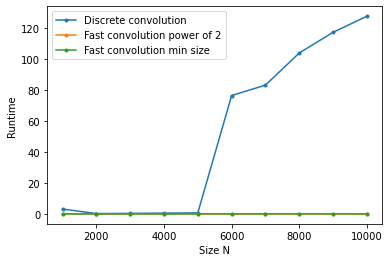

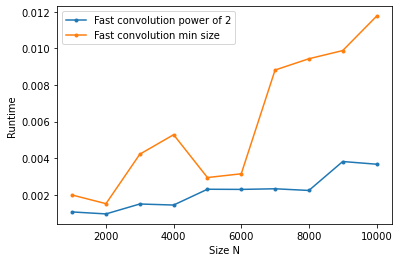

In [10]:
sizes = range(1000, 11000, 1000)
num = len(sizes)
runtimes_fftconvolution = np.zeros((num))
cycles = 20

for c in range(cycles):


    for N in range(num):
        # Your turn ...

        x=np.ones(sizes[N])
        h=np.ones(sizes[N])

        start = process_time()

        fftconvolution(x,h)

        end = process_time()

        runtimes_fftconvolution[N] += ( end-start )
        
        print("N Done: " + str(N),  end= " ")

    print("cycle " + str(c) + " completed")

runtimes_fftconvolution = runtimes_fftconvolution/cycles
        
        
#comparison






























sizes = range(1000, 11000, 1000)
num = len(sizes)
runtimes_fftconvolution_minsize = np.zeros((num))
cycles = 20

for c in range(cycles):


    for N in range(num):
        # Your turn ...

        x=np.ones(sizes[N])
        h=np.ones(sizes[N])

        start = process_time()

        fftconvolution(x,h, (sizes[N]+sizes[N]-1))

        end = process_time()

        runtimes_fftconvolution_minsize[N] += ( end-start )
        
        print("N Done: " + str(N),  end= " ")

    print("cycle " + str(c) + " completed")

runtimes_fftconvolution_minsize = runtimes_fftconvolution_minsize/cycles
        










plt.plot(sizes, runtimes_convolution, '.-', label='Discrete convolution')
plt.plot(sizes, runtimes_fftconvolution, '.-', label='Fast convolution power of 2')
plt.plot(sizes, runtimes_fftconvolution_minsize, '.-', label='Fast convolution min size')

plt.xlabel('Size N')
plt.ylabel('Runtime')
plt.legend()
plt.show()



#plt.plot(sizes, runtimes_convolution, '.-', label='Discrete convolution')
plt.plot(sizes, runtimes_fftconvolution, '.-', label='Fast convolution power of 2')
plt.plot(sizes, runtimes_fftconvolution_minsize, '.-', label='Fast convolution min size')

plt.xlabel('Size N')
plt.ylabel('Runtime')
plt.legend()
plt.show()

## <a name="Partitioned convolution">4. Partitioned convolution</a>

Performing a Fast Fourier Transform requires all input samples to be available
at the time the transform is executed. The same holds for the inverse transform.
Thus, the fast convolution technique explained above requires all input data
to be available in advance. This makes it inapplicable for a real-time processing.


Real-time audio processing is done block-by-block.
Here, the signals are recorded, processed and played back in blocks of a fixed number of samples.
The input signal $x(n)$ and output signal $y(n)$ are continuous and of indefinite length.
In essence they are <i>partitioned</i> into blocks.
Convolution techniques that work in these split operands are called <i>partitioned convolutions</i>.

The input signal $x(n)$ consists of a continuous stream of blocks $x^{(0)}(n), x^{(1)}(n), \dotsc$, each of length $B$. Superscripts indicate the index of the blocks.
The block length $B$ (also known as audio buffer size) allows to control the audio latency.
Usual block lengths for live effects and Virtual Reality systems are in range of 32, 64 or 128 samples.
Less time-critical applications, such as media players or computer games, use lengths of 256 to 2048 samples.
As the filtering is now realized on this continuous stream of sample blocks, it is called <i>running convolution</i>.
Note, that both, the input and output, are processed in length-$B$ blocks.
This means, that the output signal $y(n)$ is also represented by a stream of blocks $y^{(0)}(n), y^{(1)}(n), \dotsc$, each of length $B$.
Convolution result exceeding $B$ samples must be returned in later output blocks.

How we can we modify or adapt the fast convolution technique to apply for a real-time
filtering as well?
This becomes possible by two concepts, known as Overlap-Add and Overlap-Save.
Following, we will examine the Overlap-Add technique.

#### 4.1 Overlap-Add

One possibility is to filter each length-$B$ block with the length-$N$ impulse response.
This will produce a convolution result longer than $B$. The overlapping samples are added up in a buffer and returned in subsequent
output blocks. Hence the name, Overlap-Add (OLA).
The algorithm is shown below
<br/>
<img src="./files/OLA_stream_convolution.png" width="70%" height="70%">
<br/>

<div class="alert alert-block alert-warning">
<b>Lab Experiment 6</b><br>
  Implement the OLA convolution algorithm in the predefined function below.<br/>
  As before, debug and test it with the two sequences you convolved by hand, until you verified that it produces correct results.<br/>
</div>

In [11]:
def OLA_convolution(x, h, B, K=None, verbose=False):
    """Overlap-Add convolution of x and h with block length B"""

    M = len(x)
    N = len(h)

    # Calculate the number of input blocks
    num_input_blocks = int(np.ceil((M+N-1)/B))

    # Pad x to an integer multiple of B
    xp = zeropad(x, num_input_blocks*B)

    
    #setup ring buffer:
    buff_vertical =  int(np.ceil((B+N-1)/B) )
    buff_horizontal = int ( (B+N-1) + B*num_input_blocks )
    ring_buffer = np.zeros( (buff_vertical , buff_horizontal ) )
    
    
    
    
    #setup output:
    y = []
    
    if verbose:
        print('buffer shape:')
        print(np.shape(ring_buffer))
        print('Addition space start:')
        print(int( N + B ) )
        print('Addition space end:')
        print( int( N + 2*B) )
    

    # Convolve all blocks
    for n in range(num_input_blocks):
        # Extract the n-th input block
        xb = xp[range(n*B, (n+1)*B)]
        
        if verbose: print("xb(%d) = " % n, xb)
            

        # Fast convolution
        u = fftconvolution(xb, h, K)
        
        if verbose: print("u(%d) = " % n, u)

        # Overlap-Add the partial convolution result
        
        # add new result into buffer
        len_u = np.shape(u)[0] +1
        u = zeropad(u, buff_horizontal)
        u = np.roll(u, len_u)
        
        #print(u)
        
        
        ring_buffer[0,:] = u
        
        # sum up:
        
        
        
        sum = np.zeros(B)
        
        for i in range( buff_vertical ):
            
            
            # plus 1 bei 2
            # minus 1 bei 1
            
            
            block_coord = range( int( N + B ) , int( N + 2*B ) )
            

            if verbose:
                print(ring_buffer[i, block_coord ])
            
            sum += ring_buffer[i, block_coord ]
            
        if verbose:
            print('sum: ' + str(sum))
        
        y.append(sum)
        
        if verbose:
            print(ring_buffer)

        
        # roll unnecessary entries out of buffer:
        ring_buffer = np.roll(ring_buffer, 1, axis=0)
        
        # roll to the left! 
        ring_buffer = np.roll(ring_buffer, -B, axis=1)


        
        
        
        # convolve second half....
        
        
        
        
    y = np.array(y)
    y = y.flatten()

    return y


    #### VERY UNTESTED!
    

x = np.array([1,1,1,1])
h = np.array([1,1,1])
B=2
y = OLA_convolution(x, h, B, K=None, verbose=False)

print(y)

#%debug

[1. 2. 3. 3. 2. 1.]


#### 4.2 Overlap-Save

The other possibility for realizing a running convolution is known as Overlap-Save (OLS) scheme.
Here, the idea is to directly produce a ready-made output block of length-$B$ and avoid overlapping samples (additions).
Recall, that any length-$B$ output block contains "decay" from previous input blocks.
In the OLS scheme we will setup the input to the convolution in a way, that the output already contains
The response of the latest block plus the decay of previous blocks.
The algorithm is shown below.
<br/>
<img src="./files/OLS_stream_convolution.png" width="70%" height="70%">
<br/>

The length-$K$ FFT of the input is fed with the $K$ latest input samples of $x(n)$.
In other words, when a new block $x^{(i)}(n)$ arrives, we shift the input buffer to the left by $B$ samples
and place the new samples rightmost.

This is known as a <i>sliding window</i> of the input.
The filter impulse response is processed in the same way as for the OLA scheme.

After what we learned before, it becomes clear that we now perform a $K\times N$ convolution with a transform length of $K$.
Hence time-aliasing occurs and excess samples will result in time-aliasing as explained above.
However, this is acceptable, as the right-most $B$ samples are alias-free and valid output values.
We can use/output them directly, without any additions, as for the Overlap-Add scheme.

<div class="alert alert-block alert-warning">
<b>Lab Experiment 7</b><br>
  Implement the OLS convolution algorithm in the predefined function below.<br/>
  As before, debug and test it with the two sequences you convolved by hand, until you verified that it produces correct results<br/>
  <br/>
  <u>Hints</u>: The NumPy functions <a href="https://docs.scipy.org/doc/numpy-1.15.1/reference/generated/numpy.roll.html" target="blank">roll</a> is helpful to realize the sliding window
</div>

In [12]:
def OLS_convolution(x, h, B, K=None, verbose=False):
    """Overlap-Save convolution of x and h with block length B"""

    M = len(x)
    N = len(h)

    # Calculate the number of input blocks
    num_input_blocks = int(np.ceil((M+N-1)/B))
    
    
    # Pad x to an integer multiple of B
    xp = zeropad(x, num_input_blocks*B)

    #setup input buffer
    buff_len = nextPowerOf2(B+N-1)
    
    # Pad Filter h to suitable length
    h = zeropad(h, buff_len)
    
    #print("singal length: " + str(M))
    #print("filter length: " + str(N))
    #print("block size: " + str(B))
    #print("buffer length: " + str(buff_len))
    #print(" ")

    shift_buff = np.zeros(buff_len)
    
    #print('shift buff lengeth:' + str(np.shape(shift_buff)[0]))
    y = []

    
    # Your turn ...

    # Input buffer
    #xw = np.zeros((K,))

    # Convolve all blocks
    for n in range(num_input_blocks):
        # Extract the n-th input block
        xb = xp[n*B:n*B+B]
        
        
        
        #if verbose: print("xb(%d) = " % n, xb)

        # Sliding window of the input
        
        
        shift_buff = np.roll(shift_buff, -B)
        shift_buff[range(-B, 0)] = xb
        #print(shift_buff)

        
        
        #if verbose: print("xw(%d) = " % n, xw)

            
            
        # Fast convolution, nochmal implementiert
        
        
        x_fft = np.fft.fft(shift_buff)
        h_fft = np.fft.fft(h)
        y_fft = np.multiply(x_fft, h_fft)
        y_ifft = np.fft.ifft(y_fft)
        y_real = np.real( y_ifft )
        y_real = y_real[range(buff_len)]
        u = y_real
        
        
        #alternative mit built in aber ineffiziente FFT Length
        
        #u = np.convolve(shift_buff, h, 'full')
        #u = u[range(buff_len)]

        
        if verbose: print("u(%d) = " % n, u)

        # Save the valid output samples
        
        
            
        
        
        
        y.append(u[ range(-B, 0) ])
        #print('filter: ' + str(h) )
        #print('shiftbuff:' + str(shift_buff))
        #print('conv: ' + str(u))
        #print('added: ' + str(u[ range(-B, 0) ]))
        #print(' ')
        

        
    y = np.array(y)
    y = y.flatten()
        
    return y

x = np.array([1,1,1,1])
h = np.array([1,1,1])
B=1

y = OLS_convolution(x, h, B, K=None, verbose=False)

print(y)

[1. 2. 3. 3. 2. 1.]


#### 4.3 Computational performance

Finally, at the end of this exercise, let us measure the performance of partitioned convolutions and compare them to the other techniques.
Therefore, you can use a practical example.


<div class="alert alert-block alert-warning">
<b>Lab Experiment 8</b><br>
  Filter the audio file "files/music.wav" with the lowpass filter impulse response "files/lowpass.wav".<br/>
  Measure the runtime of all algorithms you have implemented so far.<br/>
  For the partitioned convolution techniques assume two block lengths:<br/>
  128 samples for a low-latency and 1024 samples for a moderate latency.<br/>
  <br/>
  What do you observe?<br/>
  <br/>
  <u>Important</u>: Again, perform every measurement three times and compute the average value to obtain representative numbers.
</div>

In [13]:
# Your turn ..

from functools import partial




def runtime_test(algo_fun, algo_name, x, h, cycles):


    print(algo_name)
    runtimes_convolution = np.zeros((1))

    
    for c in range(cycles):

        # Your turn ...


        start = process_time()

        music_lowpass = algo_fun()

        end = process_time()

        runtimes_convolution[0] += ( end-start )

        print("Cycle " + str(c) + " : " + str(end-start),  end= " --- ")

    runtimes_convolution = runtimes_convolution/cycles
    print(" ")
    print("Algorithm completed in " + str(runtimes_convolution))
    
    
    return runtimes_convolution[0]

    

    
    
    
    
    
    
    
    
cycles = 3





runtimes_convolution = np.zeros((1))
music_dry, Fs_music = sf.read('files/music.wav')
lowpass, Fs_lowpass = sf.read('files/lowpass.wav')
music_lowpass = np.convolve(music_dry, lowpass)
display( Audio(music_lowpass, rate=Fs_music) )


x = music_dry
h = lowpass




algo_name = 'Numpy Convolution'
algo_fun = partial(np.convolve, x, h)


runtime_test(algo_fun, algo_name, x, h, cycles)



algo_name = 'Simple FFT Convolution'
algo_fun = partial(fftconvolution, x, h)

runtime_test(algo_fun, algo_name, x, h, cycles)







algo_name = 'OLA Convolution, Blocksize: 1024'
algo_fun = partial(OLA_convolution, x, h, 1024)

result = OLA_convolution(x, h, 1024)
display( Audio(result, rate=Fs_music) )


runtime_test(algo_fun, algo_name, x, h, cycles)




algo_name = 'OLA Convolution, Blocksize: 128'
algo_fun = partial(OLA_convolution, x, h, 128)

runtime_test(algo_fun, algo_name, x, h, cycles)






algo_name = 'OLS Convolution, Blocksize: 1024'
algo_fun = partial(OLA_convolution, x, h, 1024)

result = OLS_convolution(x, h, 1024)
display( Audio(result, rate=Fs_music) )


runtime_test(algo_fun, algo_name, x, h, cycles)




algo_name = 'OLS Convolution, Blocksize: 128'
algo_fun = partial(OLA_convolution, x, h, 128)


runtime_test(algo_fun, algo_name, x, h, cycles)






# What we can see is: Longer Block Lengths are much much faster. However my implementations of OLS & OLA are not really efficient....
# However advantage is that we get the Convolution Results Block by Block as we push them trough without having to transform the whole signal at once!
# We would have even better "real time block push trough performance" (we can basically output sample by sample) but then we would have N^2 performance because we cannot use FFT (we would need to transform whole block, at least with filter length -> big delay for output)
# Therefore OLS / OLA combines advantage of block wise processing like Time-Domain Convolution with n*log(n) performance of FFT based whole block transformation










#x, Fs = sf.read("files/music.wav")
#h, Fs_h = sf.read("files/lowpass.wav")

#cycles = 10

#algorithms = {
#    "Discrete Convolution (numpy)": lambda x, h, blocklength: np.convolve(x, h),
#    "Discrete Convolution (python)": lambda x, h, blocklength: convolution(x, h),
#    "Fast convolution": lambda x, h, blocklength: fftconvolution(x, h),
#    "Overlap-Add": OLA_convolution,
#    "Overlap-Save": OLS_convolution
#}

#blocklengths = [128, 1024]

#def measure_performance(x, h, blocklength, algorithms, cycles):
 #   results = {name: 0 for name in algorithms.keys()}
  #  # measure each algorithm
   # for name, algorithm in algorithms.items():
    #    # execute algorithm multiple times to get accurate measurements
     #   for n in range(cycles):
      #      start = process_time()
       #     algorithm(x, h, blocklength)
        #    results[name] += (process_time() - start) / cycles
   # return results

#res = measure_performance(x, h, 128, algorithms, cycles)
#fig = plt.figure()
#plt.bar(range(len(res)), res.values())

#res = measure_performance(x, h, 1024, algorithms, cycles)
#fig = plt.figure()
#plt.bar(range(len(res)), res.values())



Numpy Convolution
Cycle 0 : 0.03472563700051978 --- Cycle 1 : 0.03316894300041895 --- Cycle 2 : 0.035278264000226045 ---  
Algorithm completed in [0.03439095]
Simple FFT Convolution
Cycle 0 : 0.18125637200137135 --- Cycle 1 : 0.18187833100091666 --- Cycle 2 : 0.1651133209998079 ---  
Algorithm completed in [0.17608267]


OLA Convolution, Blocksize: 1024
Cycle 0 : 6.861590698999862 --- Cycle 1 : 7.198402418000114 --- Cycle 2 : 7.859005393000189 ---  
Algorithm completed in [7.30633284]
OLA Convolution, Blocksize: 128
Cycle 0 : 61.418965850998575 --- Cycle 1 : 60.25543175400162 --- Cycle 2 : 60.94930592600031 ---  
Algorithm completed in [60.87456784]


OLS Convolution, Blocksize: 1024
Cycle 0 : 7.9959861429997545 --- Cycle 1 : 8.050596376000613 --- Cycle 2 : 8.084045177998632 ---  
Algorithm completed in [8.04354257]
OLS Convolution, Blocksize: 128
Cycle 0 : 59.60157813600017 --- Cycle 1 : 59.13499903799857 --- Cycle 2 : 59.504490257000725 ---  
Algorithm completed in [59.41368914]


59.41368914366649

## <a name="Cross-Correlation">5. Cross-Correlation</a>

Another very popular operation which is closely related to convolution is the correlation operation. The correlation operation can be used e.g., to determine the similarity between two audio signals (cross-correlation) or within a single audio signal (autocorrelation).
For instance, given the captured audio signal y, we can use the cross-correlation to find out if the audio signal x is present within y. This is done by computing the correlation coefficient between the captured signal y and signal x.
In other applications, the correlation operation is applied to estimate the relative time-of-arrival difference of an audio signal at two or more microphones. This is done by examining the shape of the correlation function as described further below.
Put simply, the correlation operation is another important building block for many audio processing applications.

Convolution and cross-correlation are related by:
\begin{equation}
x_1(n) \star x_2(n) = x_1(n) \circledast x_2(-n)
\end{equation}

where $\star$ represents the correlation operation and $\circledast$ represents the convolution operation.
Because correlation is so important and so closely related to the convolution operation, this section will teach you how to implement and apply the correlation operator.

#### <a name="Cross-Correlation in TD">5.1 Cross-Correlation in the Time Domain</a>

As seen in the equation above, to compute the correlation between two signals, you could simply use the convolution function as implemented in Section 2.1 with time-reversing signal x2:

In [14]:
x1 = np.array([0, 0, 1, 0])
x2 = np.array([1, 0, 0, 0])
y = convolution(x1, x2[::-1])
display(y)
y = np.correlate(x1, x2, 'full')
print(y)

array([0., 0., 0., 0., 0., 1., 0.])

[0 0 0 0 0 1 0]


The result of a cross-correlation operation is a time signal which may look a bit like the plot below. <br/>
The location of the peak of this function indicates the time delay estimate between the input signals.

<br/>
<img src="./files/xcorr_peak.png" width="30%" height="30%">
<br/>

<div class="alert alert-block alert-info">
  <b>Homework Exercise 5</b><br>
  Given the sequences $x1(n)=[0, 0, 1, 0]$ and $x2(n)=[1, 0, 0, 0]$ as shown above.<br/>
  1. Based on the cross-correlation result, how can you estimate the time delay in samples between these two signals?<br/>
  2. What is the time delay estimate between the signals x1 and x2, resulting from $x1(n) \star x2(n)$?<br/>
  3. What is the time delay estimate between the signals x1 and x2, resulting from $x2(n) \star x1(n)$?<br/>
  4. What can you say about the relationship between these two results? <br/>

</div>

Now let us implement the correlation operation and verify that it works correctly.

<div class="alert alert-block alert-warning">
<b>Lab Experiment 9</b><br>
  Implement the correlation operation in the predefined function below.<br/>
  Debug and test it with the two sequences you correlated using your convolution function, until you verified that it produces correct results.<br/>
  The function shall return the estimated time delay in samples.<br/>
  Note that during this lab course, a positive time delay is defined when $x_1$ arrives before $x_2$ and a negative time delay is defined when $x_2$ arrives before $x_1$.<br/>
  <br/>
</div>

In [30]:
def delayEstimationTD(x1, x2):
    """Compute the time delay between two signals in the time domain"""
    
    M = len(x1)
    N = len(x2)

    #dafür sorgen, dass beide Sequenzen auf die selbe Länge gebracht werden, sonst blöd mit 0 Punkt
    if M>=N:
        x2 = zeropad(x2,M)
        N = len(x2)
    else:
        x1 = zeropad(x1,N)
        M = len(x1)

        
    # Your turn ...
    y = np.convolve(x1, x2[::-1], 'full')
    # return the estimated sample delay between the signals
    delay_samples = np.argmax(y)
    
    #print(delay_samples)

    #substract middle of array in length:
    middle = int ( np.ceil( (M+N-1)/2 ) )
    
    # position - N + 1 -> funktioniert auch 
    
    #print('delay: ' + str(delay_samples))
    delay_samples = delay_samples - middle +1

    #print('corrected: ' + str(delay_samples))
    
    
    #print(y)
    #print(middle)

    return -1*delay_samples

x1 = np.array([0, 0, 0, 0, 1])
x2 = np.array([0, 1, 0, 0])
display(delayEstimationTD(x1, x2))
display(delayEstimationTD(x2, x1))
display(delayEstimationTD(x2, x2))

-3

3

0

#### <a name="Cross-Correlation in FD">5.2 Cross-correlation in the Frequency Domain</a>

Similar to the FFT-based fast convolution, also the correlation operation can be more efficiently computed in the frequency domain. Let's use your previously implemented function fftconvolution:

In [16]:
x1 = np.array([0, 0, 1, 0])
x2 = np.array([1, 0, 0, 0])
length = len(x1)+len(x2)-1
K = nextPowerOf2(length)
x1 = zeropad(x1, K)
x2 = zeropad(x2, K)


y = np.convolve(x1, x2[::-1], 'full')
convlen = np.shape(y)[0]
start = int((convlen - length)/2)
end = int(start + length)
y = y[range(start,end)]
#y = fftconvolution(x1, x2[::-1], K)

#x1_fft = np.fft.fft(x1)
#x2_fft = np.fft.fft(x2)
#y_fft = np.multiply(x1_fft, x2_fft)
#y_ifft = np.fft.ifft(y_fft)
#y_real = np.real( np.flip(y_ifft[range(1, length+1 )] ) )
#y = y_real
        

display(y)

array([0., 0., 0., 0., 0., 1., 0.])

Furthermore, the following relationship holds:
\begin{equation}
x_1(n) \star x_2(n) = \mathcal{IDFT}\{ \mathcal{DFT} \{ x_1(n)\} \times \mathcal{DFT}\{ x_2(n)\}^* \}
\end{equation}

with $(\cdot)^*$ denoting the complex conjugate.<br/>
The product $\mathcal{DFT} \{ x_1(n)\} \times \mathcal{DFT}\{ x_2(n)\}^*$ is also known as the cross-spectrum. Thus, instead of time-reversing the signal $x_2(n)$ prior the DFT, we can use the complex conjugate of $\mathcal{DFT}\{ x_2(n)\}$.

Now let us implement the correlation operation using the cross-spectrum by modifying your previous solution for fftconvolution.

<div class="alert alert-block alert-warning">
<b>Lab Experiment 10</b><br>
  Implement the cross-correlation operation via the cross-spectrum in the predefined function below.<br/>
  Debug and test it with the two sequences you correlated using your fftconvolution function, until you verified that it produces correct results.<br/>
  The function shall return the estimated time delay in samples.
<br/>
</div>

In [9]:
def delayEstimationIFFT(x1, x2, K=None):
    """Fast delay estimation of two sequences using the FFT"""
    M = len(x1)
    N = len(x2)

    # No predefined transform length? Choose a suitable one!
    if K is None: K = nextPowerOf2(M+N-1)
        
    x1 = zeropad(x1, K)
    x2 = np.roll(zeropad(x2, K), K-N+1) #conjugate spiegelt an 0tem sample(periodisch) und nicht an array achse -> wäre die -0.5 sample achse! -> roll
    

    # Your turn ...
    y = np.real( np.fft.ifft( np.fft.fft(x1) * np.conj(np.fft.fft(x2)) ) )

    
    delay_samples = np.argmax(y)
    
    #substract middle of array in length:
    #middle = int ( np.ceil( (M+N-1)/2 ) )
    
    #print('delay: ' + str(delay_samples))
    delay_samples = delay_samples - N + 1
    
    return -1*delay_samples

x1 = np.array([1, 0, 0, 0, 0, 0, 0])
x2 = np.array([0, 0, 0, 0, 0, 1])
y = delayEstimationIFFT(x1, x2)
display(y)
y = delayEstimationIFFT(x2, x1)
display(y)
y = delayEstimationIFFT(x1, x1)
display(y)

5

-5

0

To further lower the complexity, it is also possible to estimate the time delay directly in the frequency domain without the need to convert the cross-spectrum into the time domain via IFFT.<br/>
Here, the time delay in samples $\hat{D}$ between the signals x1 and x2 is computed from the slope of the unwrapped cross-spectrum phase $G_{x1,x2}(\omega)$.
The cross-spectrum has a linear phase response and the slope of the unwrapped phase response is proportional to the time delay between the two input signals.<br/>
The image below depicts the correlation function in the time domain (a) and the corresponding unwrapped phase of the cross-spectrum (b). The time delay in (b) is derived by $$\hat{D} = \frac{\phi_{kl}(f_1)}{2 \pi f_1}$$ <br/>
Another advantage of this algorithm is that the resolution of the delay estimation allows for subsample resolution. So fractional time delays can be estimated.<br/>
However, one drawback of this method is the sensitivity to signal noise.
To make the time delay estimation more robust against noise, further extensions to this algorithm exist. These extensions are beyond the scope of this lab exercise. Interested students can study the references below and are free to ask for more information :-) .

<br/>
<img src="./files/xcorr_phase.png" width="60%" height="60%">
<br/>

<div class="alert alert-block alert-warning">
<b>Lab Experiment 11</b><br>
  Implement the time delay estimation via the slope of the cross-spectrum phase in the predefined function below.<br/>
  <br/>
</div>

In [10]:
def delayEstimationPhase(x1, x2, K=None):
    """Delay estimation of two sequences using the phase of the cross-spectrum"""

    # No predefined transform length? Choose a suitable one!
    if K is None: K = nextPowerOf2(len(x1)+len(x2)-1)

    # Your turn ..
    
    x1 = zeropad(x1, K)
    x2 = zeropad(x2, K)
    
    #y = np.imag( np.fft.fft(x1) * np.conj(np.fft.fft(x2)) ) 
    y = np.fft.fft(x1) * np.conj(np.fft.fft(x2))

    #print(y)
    
    phase_unwrapped = np.unwrap(np.angle(y))
    D_hat = phase_unwrapped[1:] / (2*np.pi*(np.arange(1,K))) * K
    
    #print(phase_unwrapped)
    
    delay_samples = D_hat[1]
    return delay_samples

x1 = np.array([0, 0, 0, 1])
x2 = np.array([1, 0, 0, 0])
display(delayEstimationIFFT(x1, x2))
display(delayEstimationPhase(x1, x2))

# fractional delay estimation
x3 = np.array([0.5, 0.5, 0, 0])
display(delayEstimationPhase(x1, x3))

-3

-3.0

-2.5

## <a name="Conclusion">6. Conclusion</a>

Thank you for participating in this exercise.<br/>
Feedback on this exercise is welcome to improve the exercise.<br/>
For further information on the topic the following literature is suggested:

<h4>References</h4>
<br/>
<div>
<a href="https://www.audiolabs-erlangen.de/fau/professor/wefers">Frank Wefers</a> <br />
<em>Partitioned convolution algorithms for real-time auralization (PhD thesis)</em> <br />
ISBN: 978-3-8325-3943-6<br />
Logos Verlag, Berlin, 2015  <br />
Online available <a target="blank" href="http://publications.rwth-aachen.de/record/466561/files/466561.pdf?subformat=pdf">here</a>
</div>
<br/>
<div>
Matteo Frigo and Steven G. Johnson<br />
<em>The Design and Implementation of FFTW3</em><br />
Proceedings of the IEEE 93 (2), 216–231 (2005).<br />
Online available <a target="blank" href="http://www.fftw.org/fftw-paper-ieee.pdf">here</a>
</div>
<br/>
<div>
Charles Knapp and Glifford Carter<br />
<em>The generalized correlation method for estimation of time delay.</em> <br />
IEEE Transactions on Acoustics, Speech, and Signal Processing, 24(4), 320-327 (1976).
</div>
<br/>
<div>
Allan Piersol<br />
<em>Time delay estimation using phase data</em><br />
IEEE Transactions on Acoustics, Speech, and Signal Processing 29 (3), 471-477 (1981).
</div>

<h4>Acknowledgment</h4>
<br/>
The International Audio Laboratories Erlangen are a joint institution of the Friedrich-Alexander-Universitaet Erlangen-Nuernberg (FAU) and Fraunhofer Institute for Integrated Circuits IIS.